# RE-EDS Sampling Analysis

In this jupyter notebook I want to focus on the two types of sampling by RE-EDS:
 * Occurrence Sampling
 * Dominating Sampling

Authors: Salome Rieder, Benjamin Ries


In [15]:
#Imports
import os, sys

# if you have path issues, you can try this:
sys.path.append("/cluster/home/bschroed/code/reeds")

%matplotlib inline
from reeds.function_libs.analysis import visualisation as vis


#import reeds
from reeds.function_libs.analysis import file_management as fM
from reeds.function_libs.analysis import analysis as ana


## Read In Data
here we can read in some data, if you are on euler, this should work for you.
You need: 
* Energy files
* s-values

In [16]:
#Here some projet data
s_vals= [ 1.0, 0.5623413, 0.3162278, 0.1778279, 0.1, 0.0562341, 0.0316228, 0.0177828, 0.01, 0.0056234, 0.0031623, 0.0017783, 0.001, 0.0005623, 0.0003162, 0.0001778, 0.0001, 5.62e-05, 3.16e-05, 1.78e-05, 1e-05]
data_dir = "/cluster/work/igc/bschroed/REEDS/CHK1/complex_d5/b_lowerBound/analysis/data"
out_prefix = "CHK1_disres5_complex_find_lower_bound_energies"

In [17]:
ene_traj_csvs = fM.parse_csv_energy_trajectories(data_dir, out_prefix)    #gather potentials
ene_traj_csvs[0].s

's1'

## Single compartments

### finding potential thresholds
first for categorizing undersampling states in the replicas, we define a potential energy threshold, that characterizes the states as beeing sampled.
This is possible due to the density enriched regions, caused by active sampling.

#### classic
in Sidler et al. 2016, the potential threshold was defined for all states as 0. 
This is a good start, but not true for all systems.

In [19]:
pot_tresh_classic = [0 for x in range(7)]


#### density  based clustering
This approach is actually a bit costy. It performce a DBSCAN density clustering on the energies to find high density areas. If 90% of the data of one state lies in the cluster with the minimal potential energy cluster, the pot_thresh is defined by the assumption of normality of the data as:

$ V_{thresh} =  \overline{V_{i_{clustered}}} + 3 * \sigma_{i_{clustered}} $

By definition all data not lying under this threshold is considered as an outlier for normal distributions and therefore not part of an activley sampled state.

In [20]:
pot_tresh_db_clust = ana.undersampling_occurence_potential_threshold_densityClustering(ene_traj_csvs)
print("clustering",pot_tresh_db_clust)

clustering [-511.42828519 -487.76364177 -473.81142854 -544.30178399 -534.09930392]


#### minimal energy+threshold = distribution based
This approach is way more performant and is the current default. It checks if 90% of the data of one state is in maximally 300kJ away from the lowest energy.
Afterwards again the pot_thresh is defined by the assumption of normality of the data as:

$ V_{i_{thresh}} =  \overline{V_{i_{clustered}}} + 3 * \sigma_{i_{clustered}} $

By definition all data not lying under this threshold is considered as an outlier for normal distributions and therefore not part of an activley sampled state.

In [23]:
pot_tresh_dist_cut = ana.undersampling_occurence_potential_threshold_distribution_based(ene_traj_csvs)
print("distrib", pot_tresh_dist_cut)


distrib [-511.42828519 -488.11025    -474.83640034 -544.30178399 -534.43310833]


### calculating sampling distributions
Next we calculate the state sampling distributions for each replica. 


The dominating state sampling distribution based on the fraction of a state having the minimal potential energy contribution to the reference state. This state is assumed to be the state domninating the sampling of the reference state due to the definition of the laws of motion.

Second the state occurrence sampling is calculated. This sampling counts how often a state is below its before defined $V_{i_{thresh}}$. Every state frame counted here is considered to be partially sampled or contributing to the reference state.

Finally the categorization of replicas regarding if they are undersampling or not is performed. An undersampling Replica has a very high occurence sampling fraction ($>0.75$) of all states. 

In [24]:
sampling_distributions = ana.calculate_sampling_distributions(ene_traj_csvs, potential_treshold=pot_tresh_dist_cut)
sampling_distributions

{1: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
  'occurence_state': {1: 0.002, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.0},
  'undersampling': False},
 2: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
  'occurence_state': {1: 0.002, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.0},
  'undersampling': False},
 3: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
  'occurence_state': {1: 0.002, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.0},
  'undersampling': False},
 4: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
  'occurence_state': {1: 0.002, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.0},
  'undersampling': False},
 5: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
  'occurence_state': {1: 0.003, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.001},
  'undersampling': False},
 6: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 0.496, 5: 0.504},
  'occurence_state': {1: 0.005, 2: 0.004, 3: 0.0, 4: 0.85, 5: 0.539},
  'undersampling': False},
 7: {'dominating_state': {1: 0.009, 2: 0.001, 3: 0, 4: 0.243, 5: 0.747},
  'occur

### Plotting analysis

Here we want to visualize the generated data

#### Sampling timeseries
This plot shows the timeseries of the sampling per simulatoin steps.

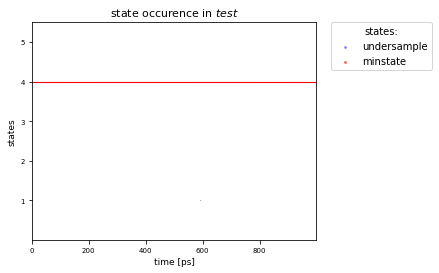

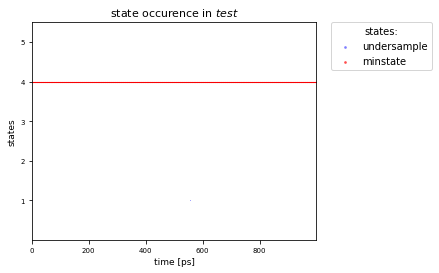

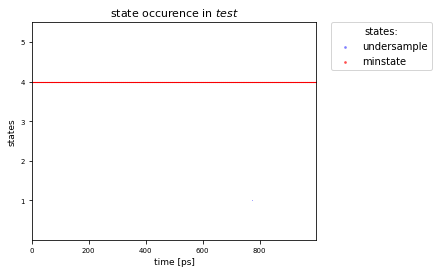

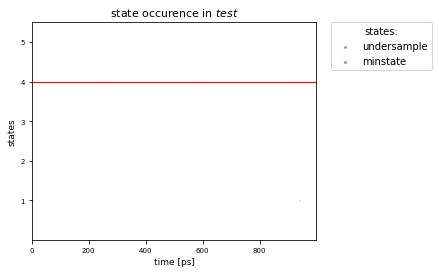

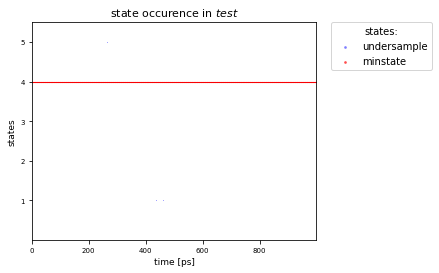

...

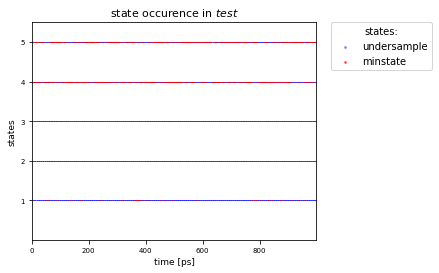

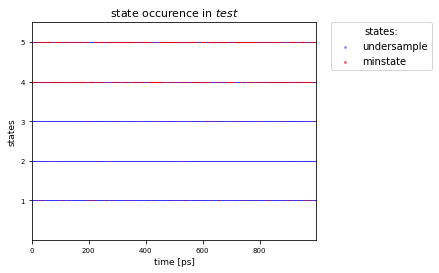

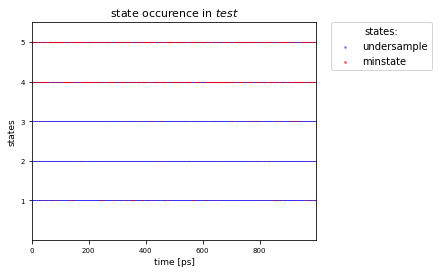

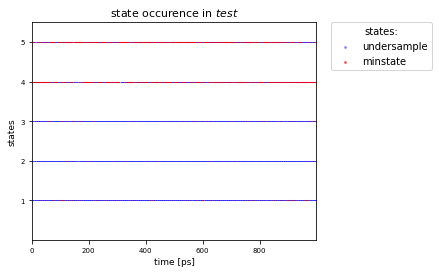

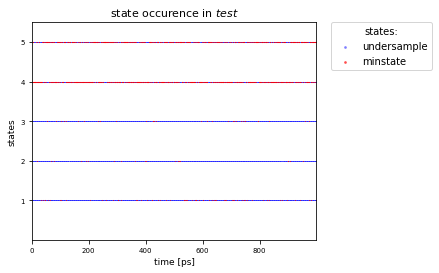

In [25]:
num_states= 5
select_states = ["e"+str(x) for x in range(1,num_states+1)]
replica = 1


for ind, replica in enumerate(ene_traj_csvs):
    dominating_state_sampling = replica[select_states].idxmin(axis=1).replace("e", "", regex=True)

    occurrence_sampling_replica = []
    for state in range(1,1+num_states):   
        occurrence_sampling_state_replica = replica.index[replica["e"+str(state)] < pot_tresh_dist_cut[state-1]]
        occurrence_sampling_replica.append(occurrence_sampling_state_replica)

    data = {"occurrence_t": occurrence_sampling_replica, "dominating_state":dominating_state_sampling}
    vis.plot_t_statepres(data=data, out_path=None)

#### Sampling histogramm
this visualisation shows the histogram of sampling per replica position.

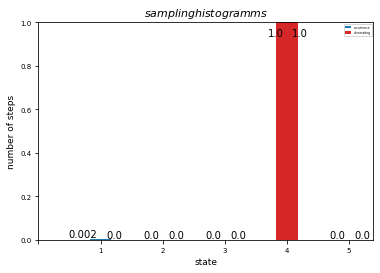

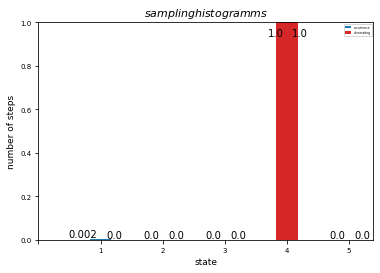

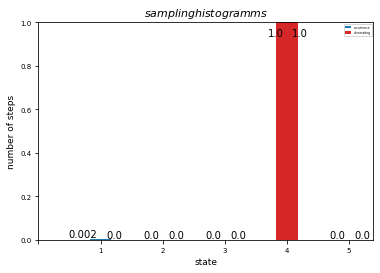

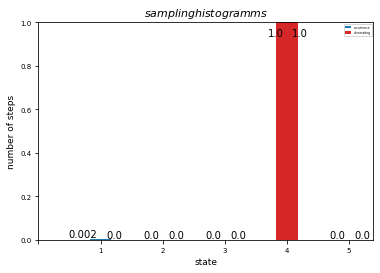

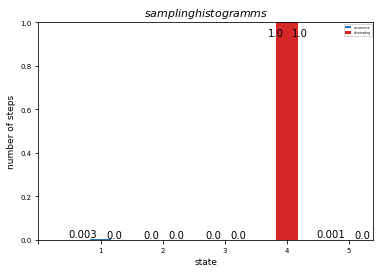

...

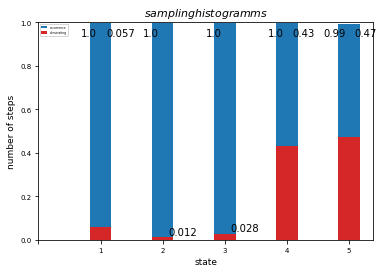

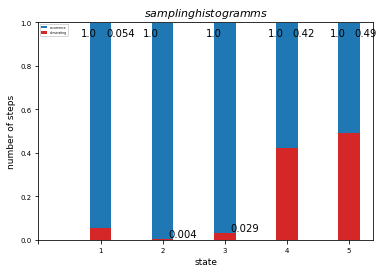

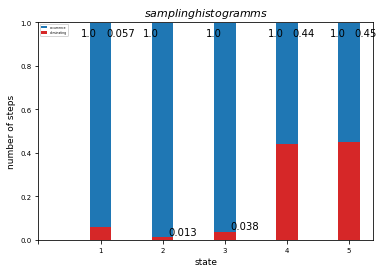

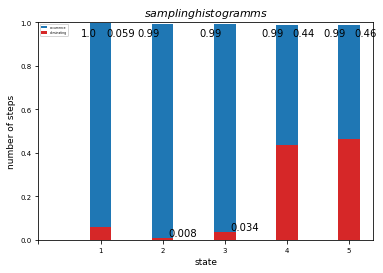

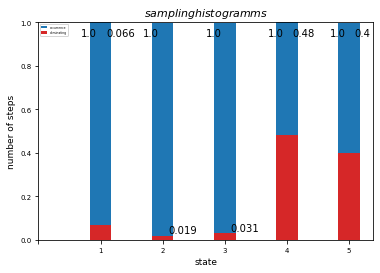

In [26]:
for ind, x in enumerate(sampling_distributions):
    vis.plot_stateOccurence_hist(data=sampling_distributions[x], out_path=None)

#### Sampling matrix

This plot shows a summary histogram of all replica positions. 
The colored line is the border to undersampling.

/cluster/home/bschroed/code/reeds/reeds/function_libs/analysis/visualisation.py:603: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()
/cluster/home/bschroed/code/reeds/reeds/function_libs/analysis/visualisation.py:646: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


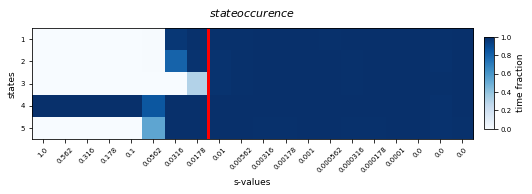

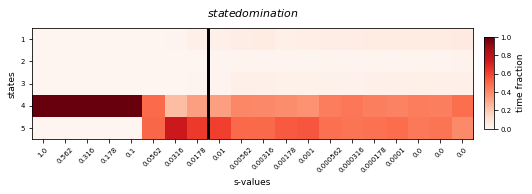

In [27]:
vis.plot_stateOccurence_matrix(sampling_distributions, 
                           #out_dir=os.getcwd(),
                           s_values=s_vals,
                           place_undersampling_threshold=True)


## All together in one function

In [29]:
sampling_analysis_results, out_plot_dir = ana.sampling_analysis(out_path=os.getcwd(), pot_tresh=pot_tresh_dist_cut,
                                                                ene_traj_csvs=ene_traj_csvs, 
                                                                s_values=s_vals, verbose=True)
sampling_analysis_results



 Potential Threshold




 Sampling Timeseries


	 replica s1
	 replica s2
	 replica s3
	 replica s4
	 replica s5
	 replica s6
	 replica s7
	 replica s8
	 replica s9
	 replica s10
	 replica s11
	 replica s12
	 replica s13
	 replica s14
	 replica s15
	 replica s16
	 replica s17
	 replica s18
	 replica s19
	 replica s20


 Calculate Sampling Distributions




 Sampling Histograms




 Sampling Matrix




{'undersamlingThreshold': 9,
 'potentialThreshold': array([-511.42828519, -488.11025   , -474.83640034, -544.30178399,
        -534.43310833]),
 'samplingDistributions': {1: {'dominating_state': {1: 0,
    2: 0,
    3: 0,
    4: 1.0,
    5: 0},
   'occurence_state': {1: 0.002, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.0},
   'undersampling': False},
  2: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
   'occurence_state': {1: 0.002, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.0},
   'undersampling': False},
  3: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
   'occurence_state': {1: 0.002, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.0},
   'undersampling': False},
  4: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
   'occurence_state': {1: 0.002, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.0},
   'undersampling': False},
  5: {'dominating_state': {1: 0, 2: 0, 3: 0, 4: 1.0, 5: 0},
   'occurence_state': {1: 0.003, 2: 0.0, 3: 0.0, 4: 1.0, 5: 0.001},
   'undersampling': False},
  6: {'dominating_state': {1: 0, 2: 0, 3: 0

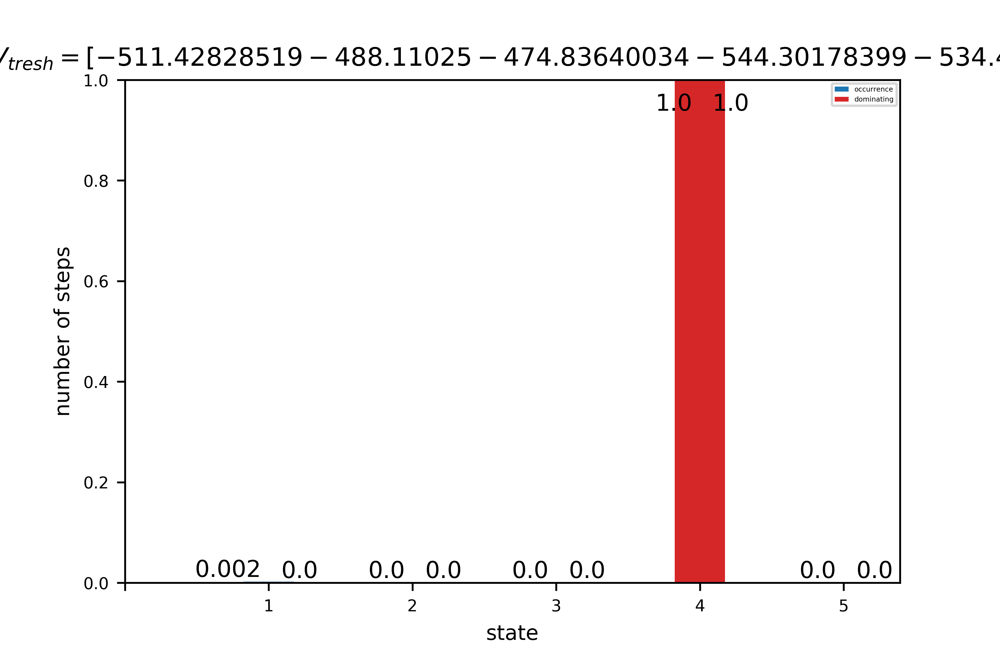

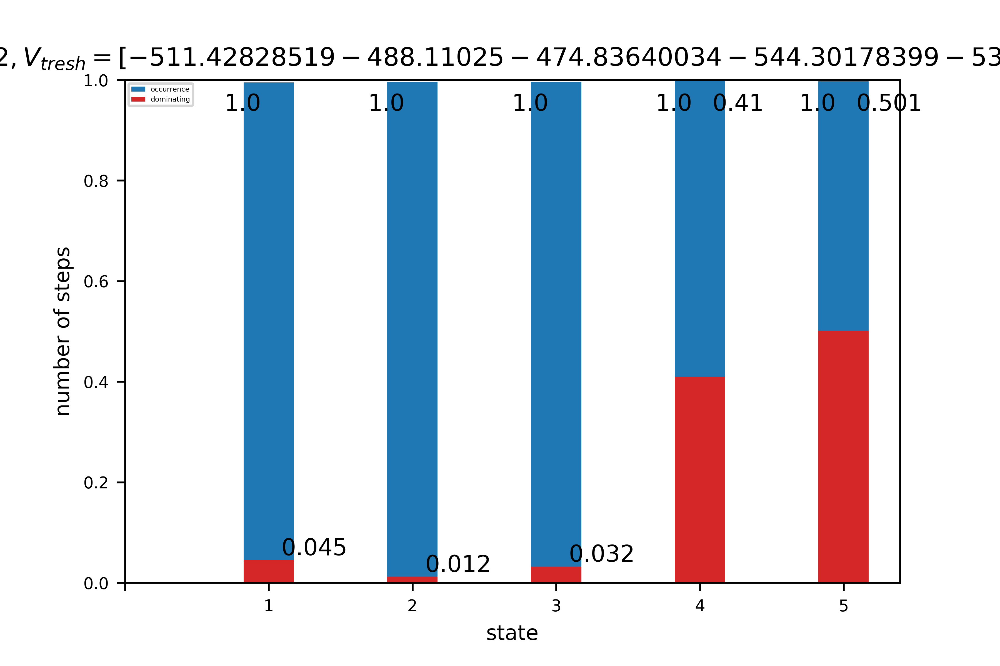

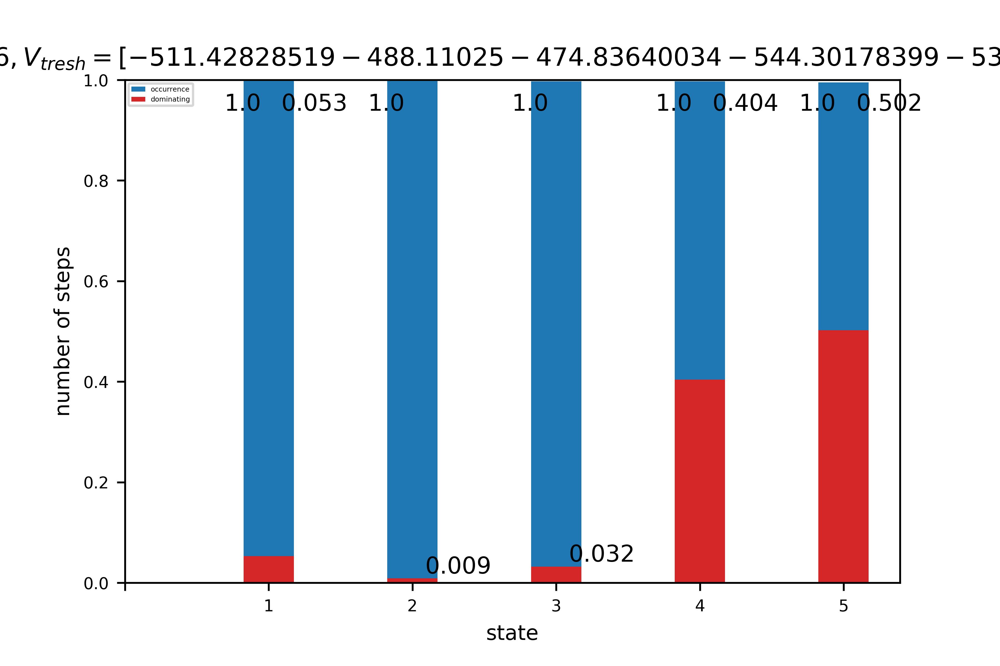

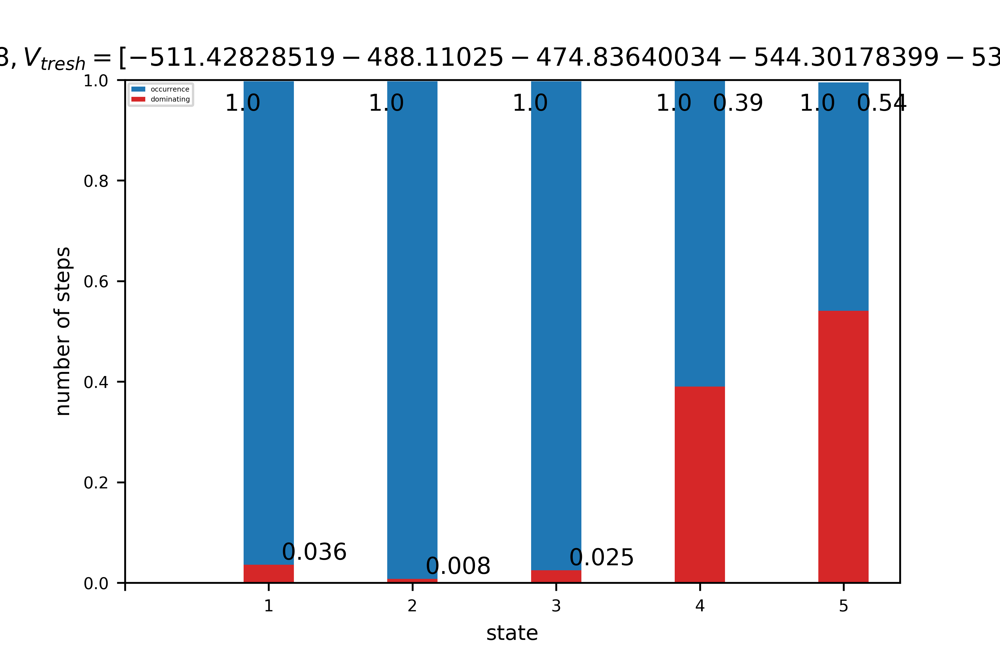

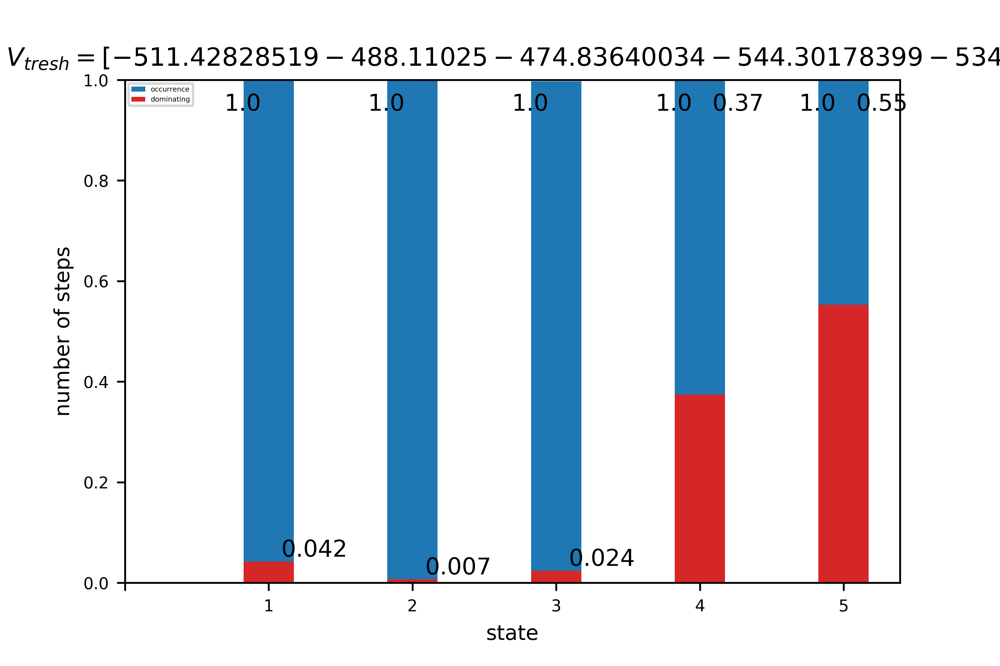

...

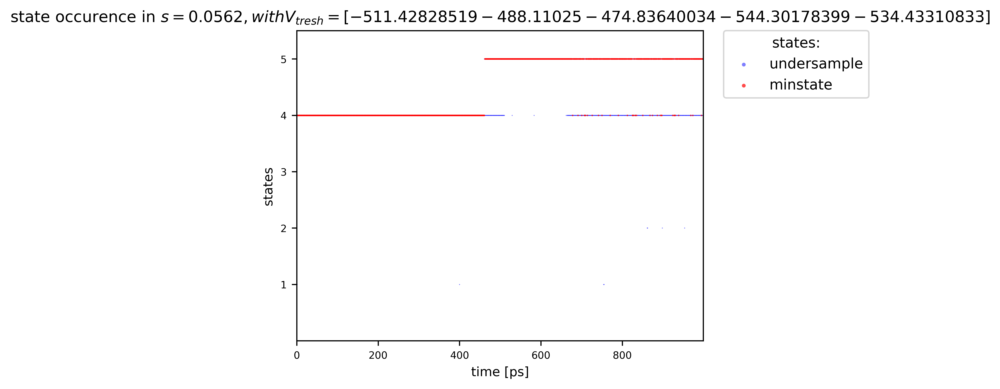

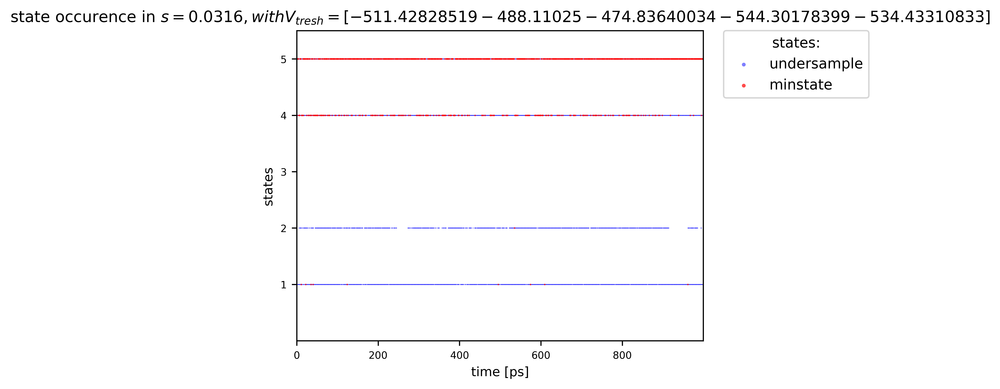

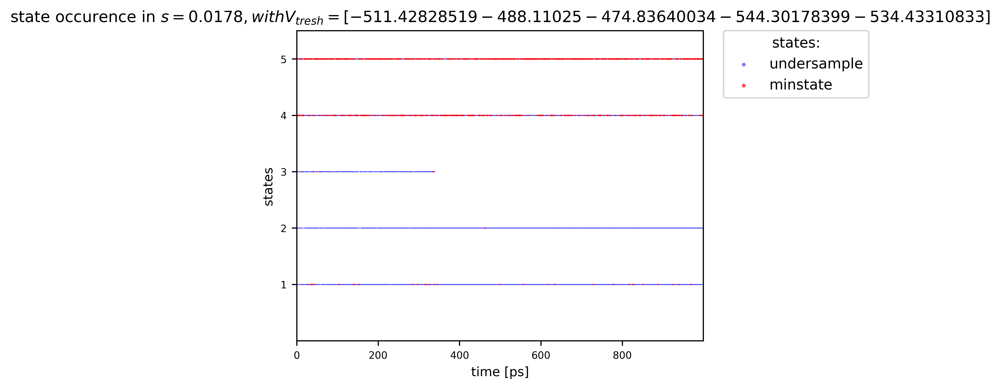

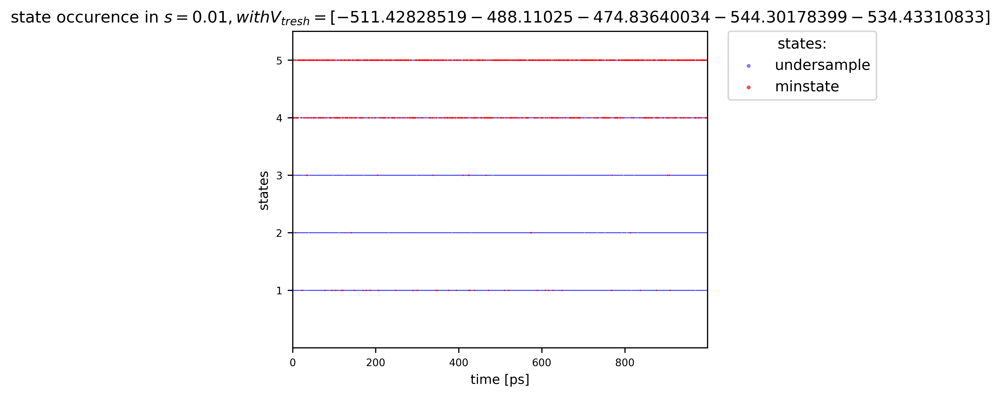

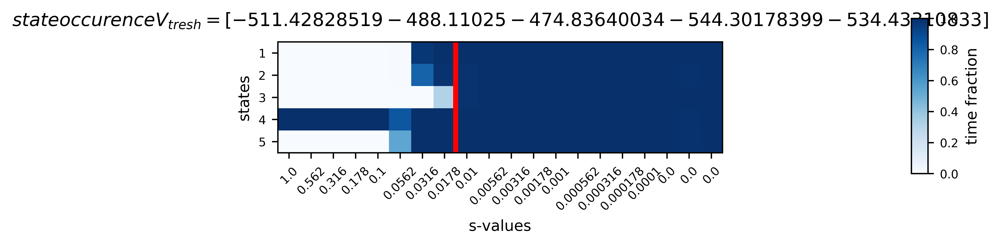

In [30]:
# Show plots
from IPython.core.display import Image, display

for png in [picture for picture in sorted(os.listdir()) if(picture.endswith(".png"))]:
    display(Image(png))
